<a href="https://colab.research.google.com/github/luisfernandocaicedo/demo-app/blob/master/Agentes_inteligentes_Tribu_IA_(LangSmith)_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

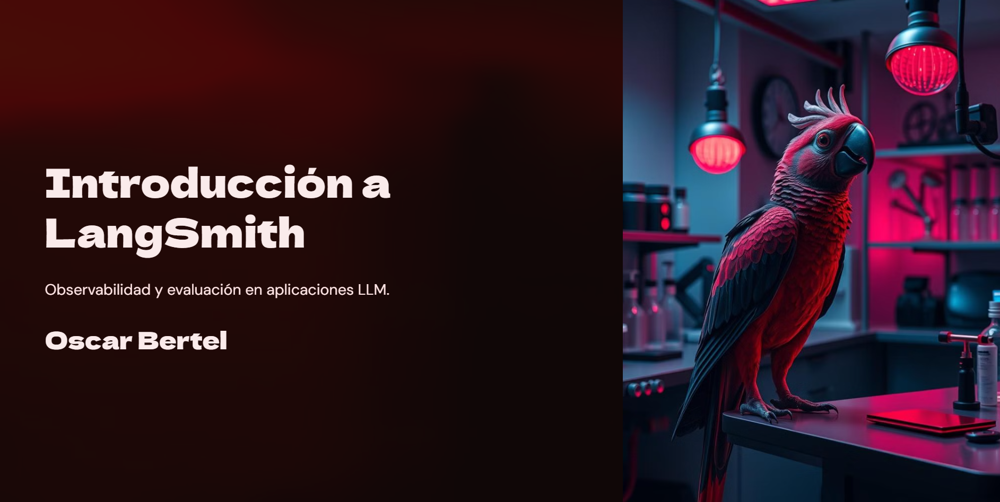

### LangeSmith, es una plataforma de observabilidad y evaluación para aplicaciones basadas en modelos de lenguaje (LLM). a continuacion vamos a explicar cómo configurar una cuenta en LangeSmith y cómo integrar el trazado (tracing) en una aplicación LLM. Los puntos clave son:

### Configuración de la Cuenta y API Key:
Se mostrara cómo generar una API key desde la interfaz de LangeSmith, asi como la forma de generar una API key para Cohere con el fin de tener un LLM gratuito con el que se pueda ejecutar un agente basico y ver el uso de langsmith para enviar trazas desde la aplicación y analisar estas.

Tambien veremos la integración con Frameworks como LangChain:
Cuando se utilizan estos frameworks.

###Ejemplo de Aplicación LLM:
Se genera un agente muy basico para validar el funcionamiento de este sistema.

### Visualización de Traces en LangeSmith:
Una vez ejecutada la aplicación, se pueden observar trazas en LangeSmith, mostrando telemetría detallada como duración, cantidad de tokens utilizados, y la secuencia completa de llamadas (árbol de trazado).

### Tracing en Funciones Arbitrarias:
Se explica cómo se puede aplicar trazado a cualquier función Python mediante un decorador del SDK de LangeSmith, permitiendo rastrear pasos adicionales como el uso de herramientas (por ejemplo, una simulada consulta a una base de datos).

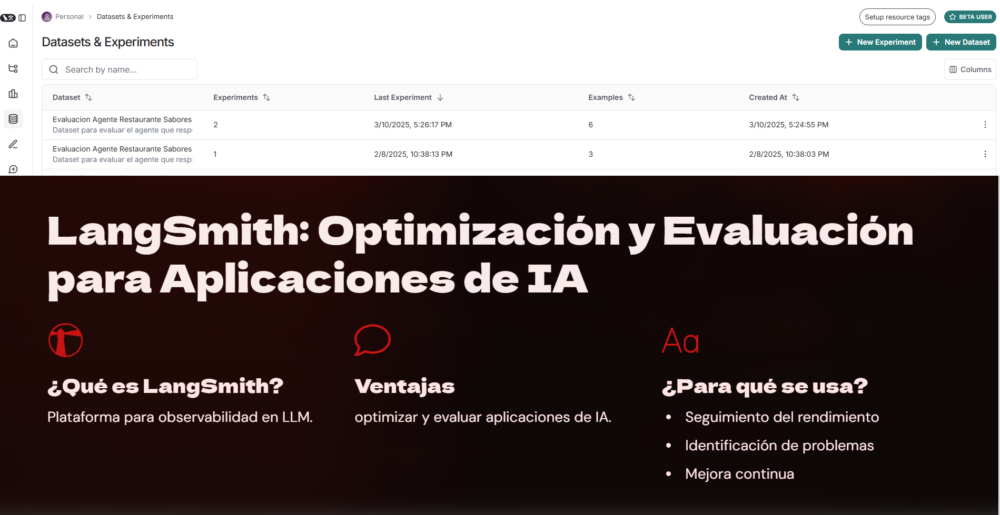

Pros de LangeSmith
1.	Integración con LangChain y otros frameworks
2.	Compatibilidad con modelos de IA populares y herramientas
o	Es una solución versátil para múltiples aplicaciones.
3.	Herramienta valiosa para observabilidad y evaluación
o	incluye herramientas para observar y evaluar el comportamiento de un agente o un sistema que usa un LLM
4.	Facilidad de implementación
o	Especialmente si está alineado con LangChain, o LangGraph

Contras de LangSmith:
1.	Costos Asociados: Al ser un servicio de pago, puede representar una barrera para proyectos más pequeños o startups con presupuestos limitados.
2.	Integración: Algunas integraciones son difíciles de lograr especialmente en sistemas no code.
3.	Complejidad Inicial: La configuración y gestión de múltiples componentes pueden ser complejas, especialmente para equipos sin experiencia previa en desarrollo de LLM.


# Requisitos para correr este colab
Cargar los archivos que alimentaran la base de conocimiento para el caso de este ejempo, vamos a usar unos archivos de un supuesto restaurante, (aun asi tu puede usar cualquier PDF pero en ese caso debes ajustar los Prompts), estos archivos se pueden descargar del siguiente link y ponerlos en el area de archivos de colab.
https://drive.google.com/drive/folders/1RAV69H5Ex26Ic_xEl82Fp7R0TD63IAJR?usp=drive_link

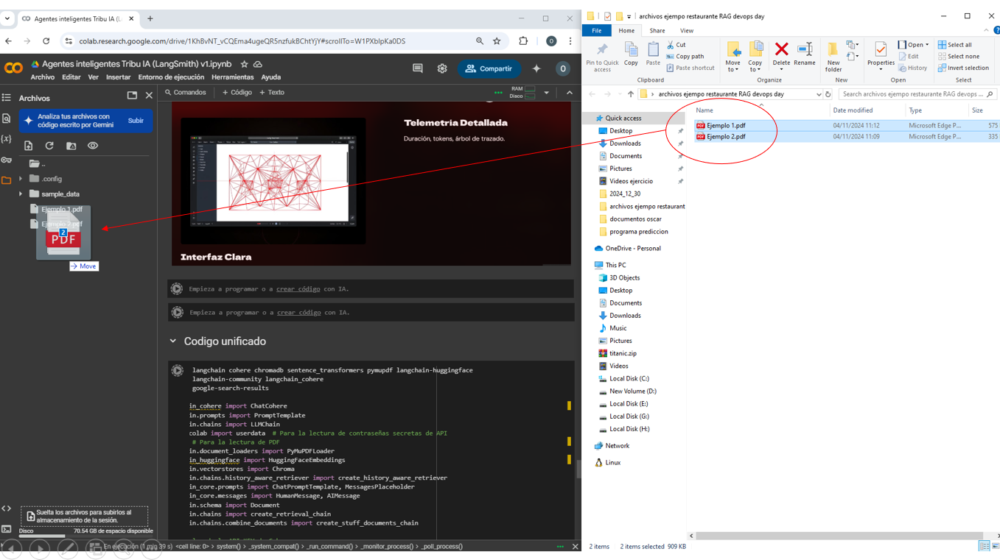

#Configuracion inicial (Seguiremos los siguientes pasos)

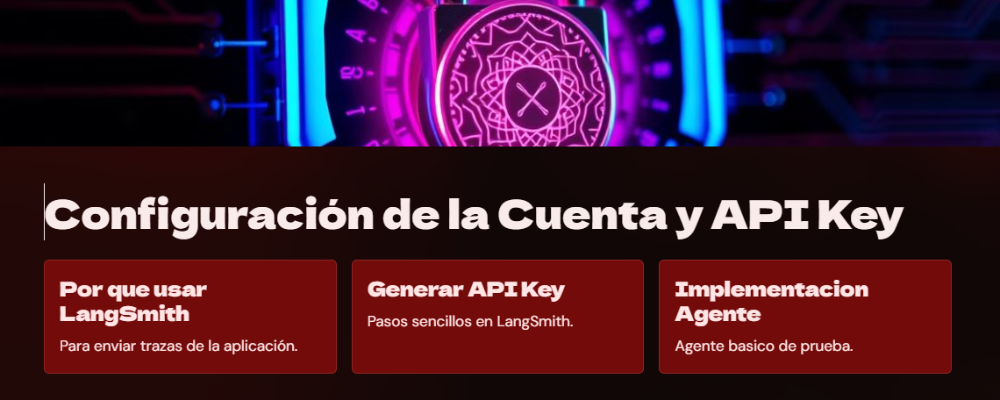

## Obtener la clave de API de LangSmith:
* Accede al dashboard de LangSmith: https://smith.langchain.com/.
* Crea una cuenta o inicia sesión con tu correo.
* En la configuración de tu cuenta, ve a la sección de "API Keys".
* Haz clic en "Generar nueva clave" y sigue las instrucciones para crear una clave de API.
* Copia la clave generada.
* Guardar la clave en los "Secretos" de Colab:
 *  En tu cuaderno de Colab, haz clic en el ícono de "Llave" en la barra lateral derecha para abrir la sección de "Secretos".
 * Haz clic en "Añadir secreto".
 * Introduce un nombre identificador, en este caso: LANGSMITH_API_KEY.
 * Pega la clave de API en el campo de valor y guarda el secreto.

 Documentacion en: https://docs.smith.langchain.com/

## Obtener la clave de API de Cohere:
* Accede al dashboard de cohere. (https://dashboard.cohere.com/api-keys)
* Crea un usuario he inicia sesión con tu cuenta de correo.
* Haz clic en "Obtener clave de API" y sigue las instrucciones para crear una nueva clave.
* Guarda la clave en los "Secretos" de Colab asi:
    1. En tu cuaderno de Colab, haz clic en el ícono de "Llave" en la barra lateral derecha para abrir la sección de "Secretos".
    2. Haz clic en "Añadir secreto" y proporciona el nombre (GOOGLE_API_KEY) y el valor correspondiente a tu clave de API.

# Inicio del Codigo

## Instalar las dependencias necesarias

Instala el paquete google-generativeai para interactuar con la API de Gemini


In [ ]:
!pip install \
    chromadb==0.6.3 \
    cohere==5.14.0 \
    langchain==0.3.20 \
    langchain-cohere==0.4.2 \
    langchain-community==0.3.19 \
    langchain-core==0.3.43 \
    langchain-huggingface==0.1.2 \
    langchain-openai==0.3.8 \
    langchain-text-splitters==0.3.6 \
    langsmith==0.3.13 \
    openai==1.65.5 \
    sentence-transformers==3.4.1 \
    pymupdf==1.25.3 \
    -U duckduckgo-search==7.5.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.1/611.1 kB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 58.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.5/474.5 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.2/284.2 kB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 7.6 MB/s eta 0:

In [ ]:
from langchain_cohere import ChatCohere
from langchain.prompts import PromptTemplate
from langchain.chains import LLMChain
from google.colab import userdata  # Para la lectura de contraseñas secretas de API
import fitz  # Para la lectura de PDF
from langchain.document_loaders import PyMuPDFLoader
from langchain_huggingface import HuggingFaceEmbeddings
from langchain.vectorstores import Chroma
from langchain.chains.history_aware_retriever import create_history_aware_retriever
from langchain_core.prompts import ChatPromptTemplate, MessagesPlaceholder
from langchain_core.messages import HumanMessage, AIMessage
from langchain.schema import Document
from langchain.chains import create_retrieval_chain
from langchain.chains.combine_documents import create_stuff_documents_chain
import os
from pydantic import BaseModel
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from langchain.agents import initialize_agent, Tool
from langchain.tools import DuckDuckGoSearchRun

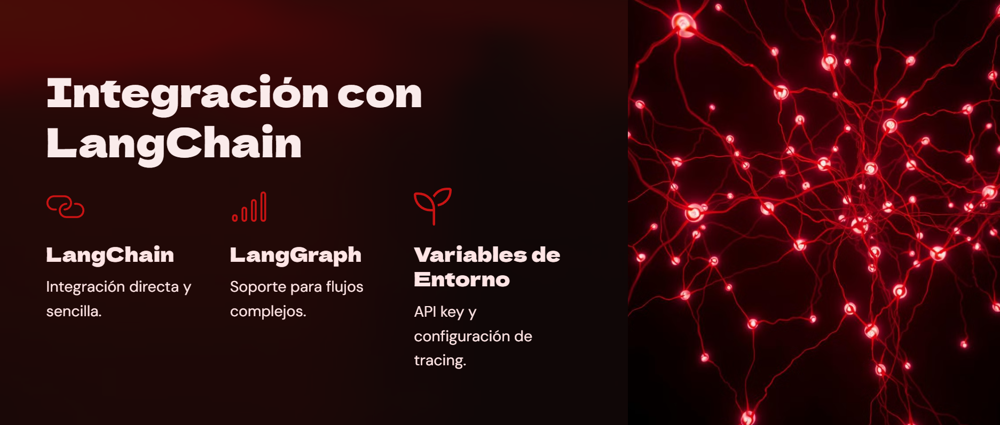

##Configuracion para Obtener datos en LANGSMITH

Establece la clave de API como una variable de entorno

In [ ]:
# Obtén el valor de la API_KEY de Cohere
api_key_LANGSMITH = userdata.get('LANGSMITH_API_KEY')
# Verifica si el secreto se obtuvo correctamente
if api_key_LANGSMITH is None:
    raise ValueError("No se pudo obtener la clave de API. Asegúrate de que el secreto 'LANGSMITH_API_KEY' está configurado en Colab.")
else:
    import os
    os.environ["LANGSMITH_API_KEY"] = api_key_LANGSMITH

Configura variables de entorno necesarias

In [ ]:
os.environ["LANGCHAIN_TRACING_V2"] = "true"
os.environ["LANGCHAIN_ENDPOINT"] = "https://api.smith.langchain.com"
os.environ["LANGCHAIN_API_KEY"] = api_key_LANGSMITH
os.environ["LANGCHAIN_PROJECT"] = "Agente Tribu IA"
OPENAI_API_KEY="<your-openai-api-key>"

## Configurar el entorno:

Establece la clave de API como una variable de entorno

In [ ]:
# Obtén el valor de la API_KEY de Cohere
api_key = userdata.get('COHERE_API_KEY')

# Verifica si el secreto se obtuvo correctamente
if api_key is None:
    raise ValueError("No se pudo obtener la clave de API. Asegúrate de que el secreto 'COHERE_API_KEY' está configurado en Colab.")
else:
    import os
    os.environ["COHERE_API_KEY"] = api_key

## Inicializar el cliente de LangSmith

In [ ]:
from langsmith import Client
client = Client()

# Ajusta la metrica de acuraccy (en este caso usando una metrica simple por similaridad semantica)

In [ ]:
# Modelo para evaluar precisión usando similitud de embeddings
model = SentenceTransformer('all-MiniLM-L6-v2')

# Función de evaluación usando similitud
def evaluar_similitud(respuesta_agente, respuesta_referencia, umbral=0.7):
    respuesta_embedding = model.encode([respuesta_agente.lower()])
    referencia_embedding = model.encode([respuesta_referencia.lower()])
    similitud = cosine_similarity(respuesta_embedding, referencia_embedding)[0][0]
    return similitud > umbral

## Configurar el entorno del modelo:

Con la clave de API obtenida, ya puedes configurar el modelo de lenguaje a usar, asi como este podriamos usar cualquier otro LLM, con ligeras modificaciones, se elegio este debido a que es gratuito y lo unico que se necesita para usarlo es una cuenta de correo y registro.

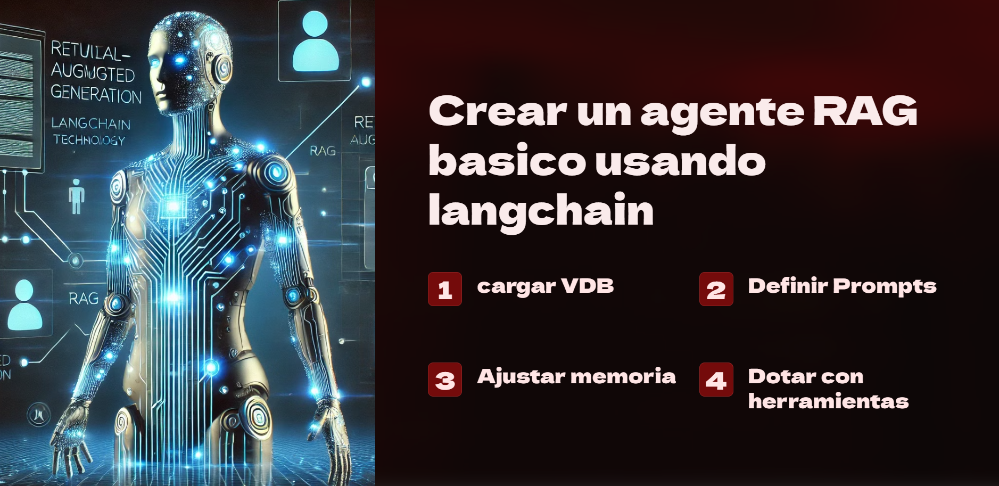

### Configura el modelo de lenguaje:

In [ ]:
# Configurar el modelo de lenguaje de Cohere
llm = ChatCohere(model="command-r-plus-08-2024", temperature=0.3)

### Define el prompt inicial:


In [ ]:
# Crear el prompt personalizado con 'context' como variable de entrada
prompt = PromptTemplate.from_template("Eres un asistente personal, que siempre responde solo sobre lo que esta bastante seguro y que se dedica a dar respuestas relevantes al Restaurante Sabores del alma, pero si te preguntan por cualquier cosas que piensas que podria estar relacionanda con el restaurante, entonces responde relativo al restaurante claro si eso pudiera tener sentido, si te piden algo que no es relevante simplemente se cortes he indica que eso escapa de tu rango de accion. Aquí está el contexto: {context}. Responde a la siguiente consulta: {input}")

### Crea la cadena de LangChain:

In [ ]:
chain = LLMChain(llm=llm, prompt=prompt)

### Implementar la base de conocimientos:

Cargar los archivos que alimentaran la base de conocimiento.

In [ ]:
# Definir la función para extraer texto de PDFs
def extraer_texto_pdf(ruta_pdf):
    texto_completo = ""
    documento = fitz.open(ruta_pdf)
    for pagina in documento:
        texto_completo += pagina.get_text()
    return texto_completo

# Rutas de los archivos PDF
rutas_pdfs = ['/content/Ejemplo 1.pdf', '/content/Ejemplo 2.pdf']

# Extraer texto de cada PDF
textos_pdfs = [extraer_texto_pdf(ruta) for ruta in rutas_pdfs]

# Convertir los textos extraídos en objetos Document con metadata
documentos = [Document(page_content=texto, metadata={"source": ruta}) for texto, ruta in zip(textos_pdfs, rutas_pdfs)]

Cargar la base de datos vectorial

In [ ]:
# Inicializar el modelo de embeddings con HuggingFaceEmbeddings
modelo_embeddings = HuggingFaceEmbeddings(model_name="all-MiniLM-L6-v2")

# Crear la base de datos vectorial con ChromaDB
vectorstore = Chroma.from_documents(documentos, modelo_embeddings)

# Crear el prompt para reformular la consulta basada en el historial
rephrase_prompt = ChatPromptTemplate.from_messages([
    MessagesPlaceholder(variable_name="chat_history"),
    ("user", "{input}"),
    ("user", "Dada la conversación anterior, genera una consulta de búsqueda para obtener información relevante.")
])

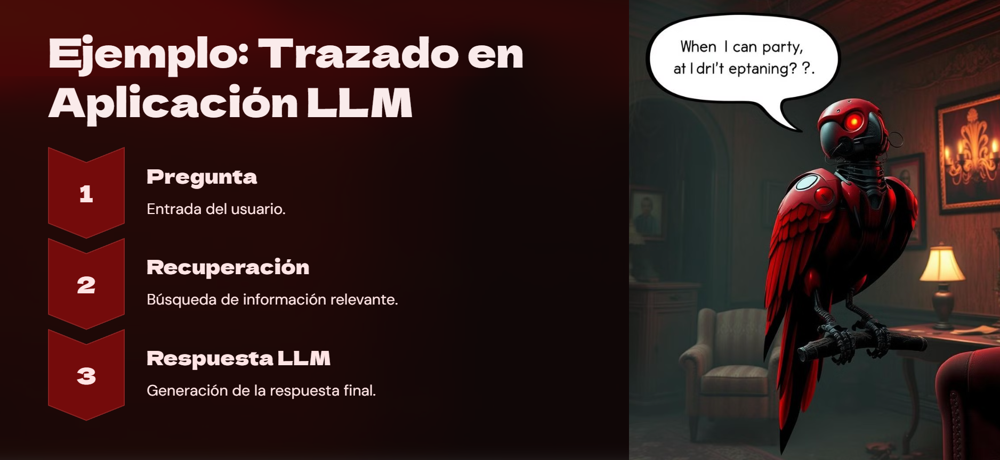

Ajustar el sistema de memoria del agente

In [ ]:
# Crear el recuperador con historial de conversaciones
retriever = create_history_aware_retriever(llm=llm, retriever=vectorstore.as_retriever(), prompt=rephrase_prompt)

# Crear la cadena que combina los documentos recuperados
combine_docs_chain = create_stuff_documents_chain(llm=llm, prompt=prompt)

# Crear la cadena de recuperación y respuesta utilizando create_retrieval_chain
qa_chain = create_retrieval_chain(retriever=retriever, combine_docs_chain=combine_docs_chain)

# Definir el historial de conversación
chat_history = [
    HumanMessage(content="¿Cuantas puntos tiene el restaurante?"),
    AIMessage(content="Actualmente el restaurante tiene 10 locales ubicados en diferentes paises y ciudades.")
]

## Evaluación del rendimiento sobre preguntas de referencia

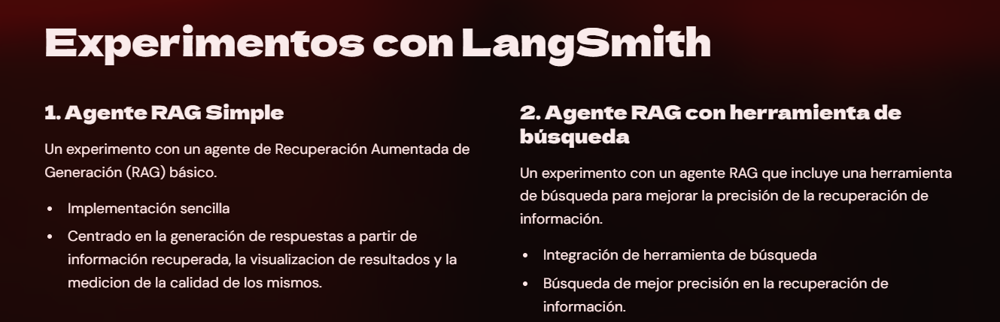

### Experimento 1 (Agente RAG simple)

In [ ]:
import langchain
langchain.debug = True  # Esto activa el debugging global, incluyendo colores

# Modelo para evaluar precisión usando similitud de embeddings
model = SentenceTransformer('all-MiniLM-L6-v2')

# Función de evaluación usando similitud

def evaluar_similitud(respuesta_agente, respuesta_referencia, umbral=0.7):
    respuesta_embedding = model.encode([respuesta_agente.lower()])
    referencia_embedding = model.encode([respuesta_referencia.lower()])
    similitud = cosine_similarity(respuesta_embedding, referencia_embedding)[0][0]
    return similitud > umbral

# Diccionario de referencias para evaluación automática
referencias = {
    "¿Cuáles son los Horarios de Apertura y Cierre del restaurante Sabores del alma?":
        "Los horarios de funcionamiento de nuestros restaurantes son: Lunes a Jueves: 12:00 pm - 11:00 pm / Viernes y Sábado: 12:00 pm - 12:00 am / Domingo: 11:00 am - 9:00 pm.",

    "¿Dónde se ubica el restaurante?":
        "El restaurante cuenta con 10 locales en países como Colombia, Perú, Chile, Argentina, Ecuador, Venezuela, Paraguay, Uruguay, Bolivia y Brasil.",

    "¿Quiero hacer una reserva cuáles son mis opciones?":
        "Puedes hacer tu reserva directamente llamando a nuestros locales o mediante nuestra página web oficial."
}

# Historial inicial
chat_history = [
    HumanMessage(content="que puedes hacer?"),
    AIMessage(content="Hola Soy un agente inteligente dispuesto a brindarte informacion sobre lo que necesites saber relacionado con el restaurante sabores del alma. Que puedo hacer por ti?.")
]

# Bucle interactivo con RAG y evaluación automática
while True:
    consulta_usuario = input("Pregunta al agente (escribe 'salir' para terminar): ")
    if consulta_usuario.lower() in ["salir", "exit", "quit"]:
        print("Finalizando la conversación.")
        break

    # Ejecutar consulta usando RAG
    respuesta_agente = qa_chain.invoke({"input": consulta_usuario, "chat_history": chat_history}, verbose=True)['answer']

    # Mostrar respuesta del agente
    print("Agente:", respuesta_agente)

    # Evaluar automáticamente si la consulta está en referencias
    respuesta_referencia = referencias.get(consulta_usuario, None)

    if respuesta_referencia:
        es_correcto = evaluar_similitud(respuesta_agente, respuesta_referencia)
        resultado_eval = "✅ Correcta" if es_correcto else "❌ Incorrecta"
        print(f"Evaluación automática: {resultado_eval}")
    else:
        print("No hay referencia disponible para evaluar esta respuesta.")

    # Actualizar historial de conversación (corregido aquí)
    chat_history.append(HumanMessage(content=consulta_usuario))
    chat_history.append(AIMessage(content=respuesta_agente))

    # Mostrar respuesta
    print("Respuesta del Agente:", respuesta_agente)


#### **Ejemplo de resultados obtenidos en Langsmit**

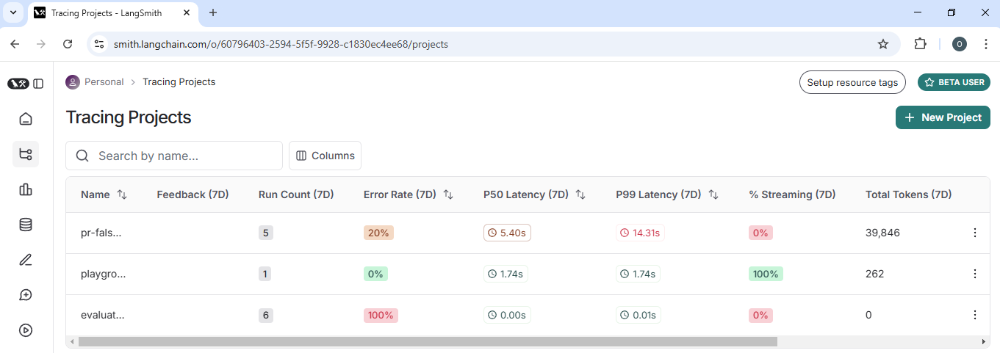

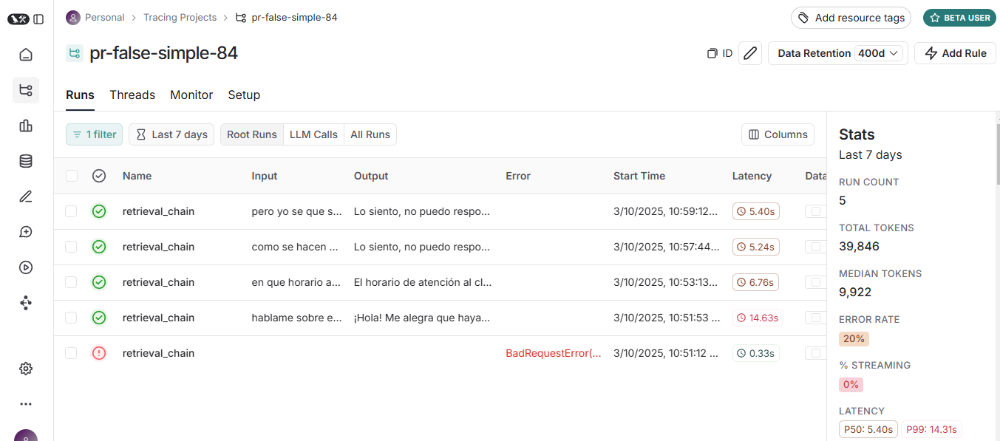

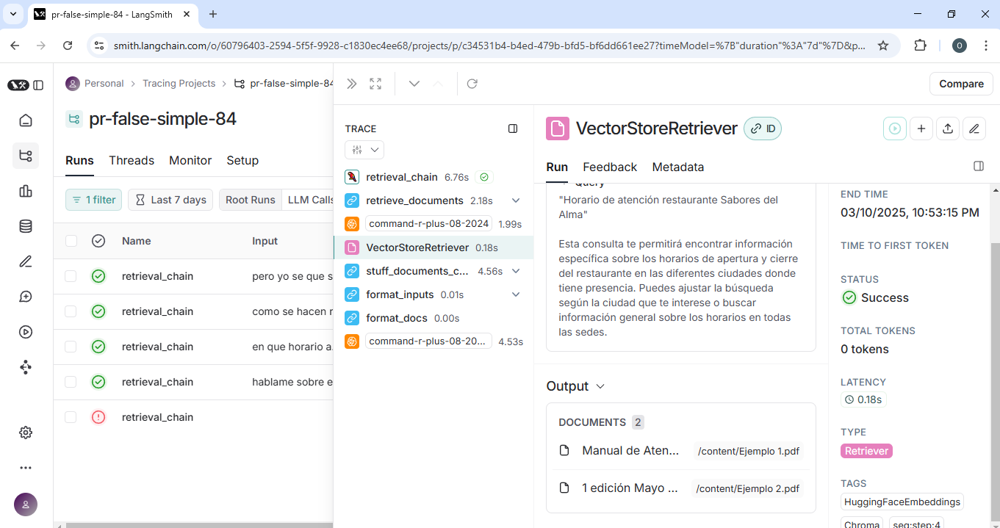

### Experimento2 (Agente Rag con herramienta de busqueda)

Añadiendo una nueva tool y cambiando el prompt

In [ ]:
# Modelo para evaluar precisión usando similitud de embeddings
model = SentenceTransformer('all-MiniLM-L6-v2')

# Herramienta de búsqueda web
search = DuckDuckGoSearchRun()
tools = [
    Tool(
        name="web_search",
        func=search.run,
        description="Útil para responder preguntas sobre eventos actuales o información actualizada no disponible localmente."
    )
]

# Prompt ajustado para incluir herramienta web
prompt = ChatPromptTemplate.from_messages([
    ("system", "Eres un asistente experto del restaurante Sabores del Alma. Usa la información local para responder preguntas sobre el restaurante. Si la información solicitada no está disponible localmente o es sobre eventos actuales, utiliza la herramienta 'web_search' para buscar en internet."),
    MessagesPlaceholder(variable_name="chat_history"),
    ("human", "{input}")
])

# Inicializar agente con herramientas
agent = initialize_agent(tools, llm, agent="chat-conversational-react-description", verbose=True, memory=None)

# Diccionario de referencias para evaluación automática
referencias = {
    "¿Cuáles son los Horarios de Apertura y Cierre del restaurante Sabores del alma?":
        "Los horarios de funcionamiento de nuestros restaurantes son: Lunes a Jueves: 12:00 pm - 11:00 pm / Viernes y Sábado: 12:00 pm - 12:00 am / Domingo: 11:00 am - 9:00 pm.",

    "¿Dónde se ubica el restaurante?":
        "El restaurante cuenta con 10 locales en países como Colombia, Perú, Chile, Argentina, Ecuador, Venezuela, Paraguay, Uruguay, Bolivia y Brasil.",

    "¿Quiero hacer una reserva cuáles son mis opciones?":
        "Puedes hacer tu reserva directamente llamando a nuestros locales o mediante nuestra página web oficial."
}

# Función para evaluar usando LLM
def evaluar_con_llm(respuesta_agente, respuesta_referencia):
    evaluacion = llm.invoke(f"""Evalúa si la respuesta del agente es conceptualmente correcta comparada con la respuesta esperada.

Respuesta del agente: {respuesta_agente}
Respuesta esperada: {respuesta_referencia}

Responde solo "Correcta" o "Incorrecta".""")
    return evaluacion.lower().strip().startswith("correcta")

# Historial inicial
chat_history = [
    HumanMessage(content="¿Cuántos puntos tiene el restaurante?"),
    AIMessage(content="Actualmente el restaurante tiene 10 locales ubicados en diferentes países y ciudades.")
]

# Bucle interactivo con RAG, herramienta web y evaluación automática con LLM
while True:
    consulta_usuario = input("Pregunta al agente (escribe 'salir' para terminar): ")
    if consulta_usuario.lower() in ["salir", "exit", "quit"]:
        print("Finalizando la conversación.")
        break

    # Ejecutar consulta usando agente
    respuesta_agente = agent.invoke({"input": consulta_usuario, "chat_history": chat_history})['output']

    # Mostrar respuesta del agente
    print("Agente:", respuesta_agente)

    # Evaluar automáticamente con LLM si la consulta está en referencias
    respuesta_referencia = referencias.get(consulta_usuario, None)

    if respuesta_referencia:
        es_correcto = evaluar_con_llm(respuesta_agente, respuesta_referencia)
        resultado_eval = "✅ Correcta" if "sí" in evaluacion.lower() else "❌ Incorrecta"
        print(f"Evaluación automática con LLM: {resultado_eval}")
    else:
        print("No hay referencia disponible para evaluar esta respuesta.")

    # Actualizar historial de conversación
    chat_history.append(HumanMessage(content=consulta_usuario))
    chat_history.append(AIMessage(content=respuesta_agente))


Ejemplo de resultados

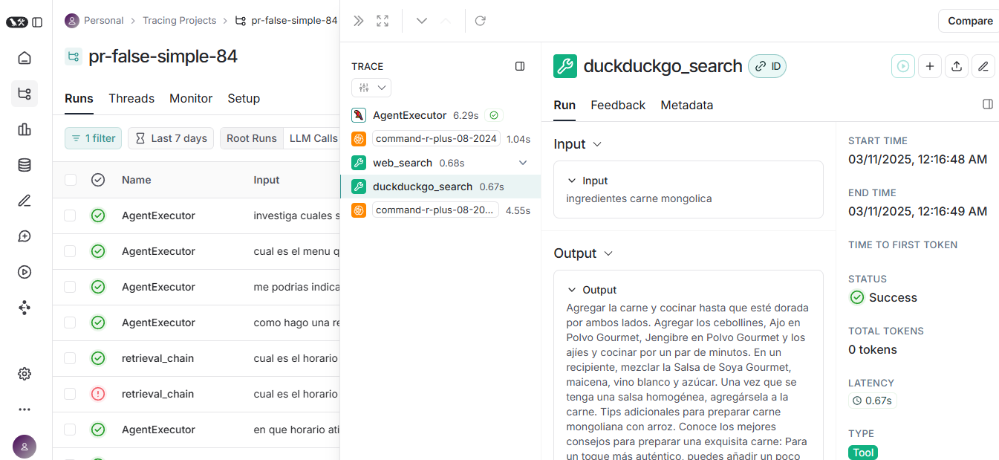

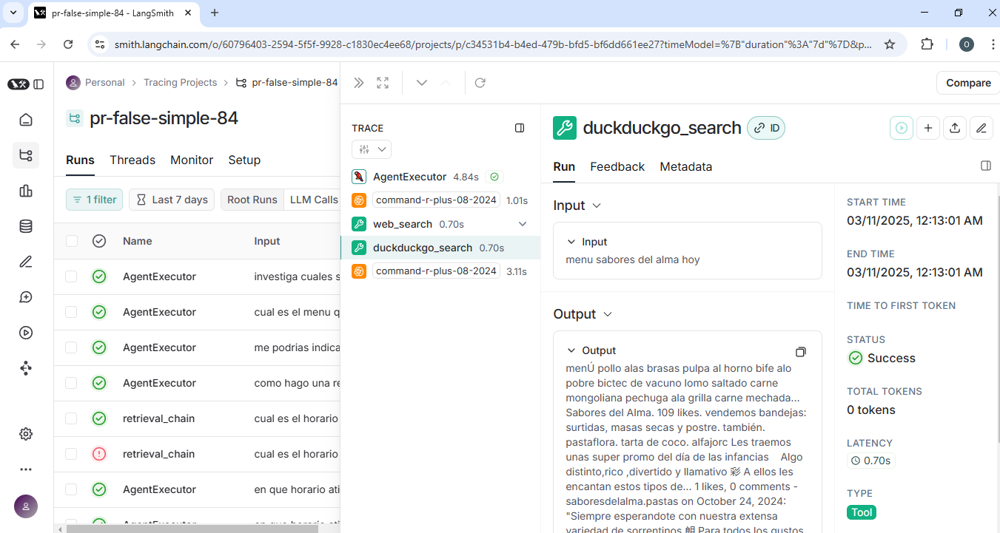

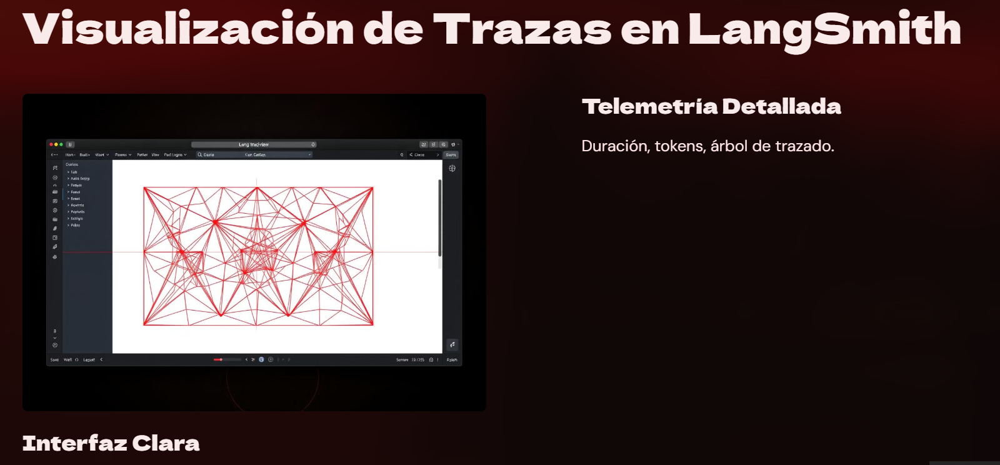

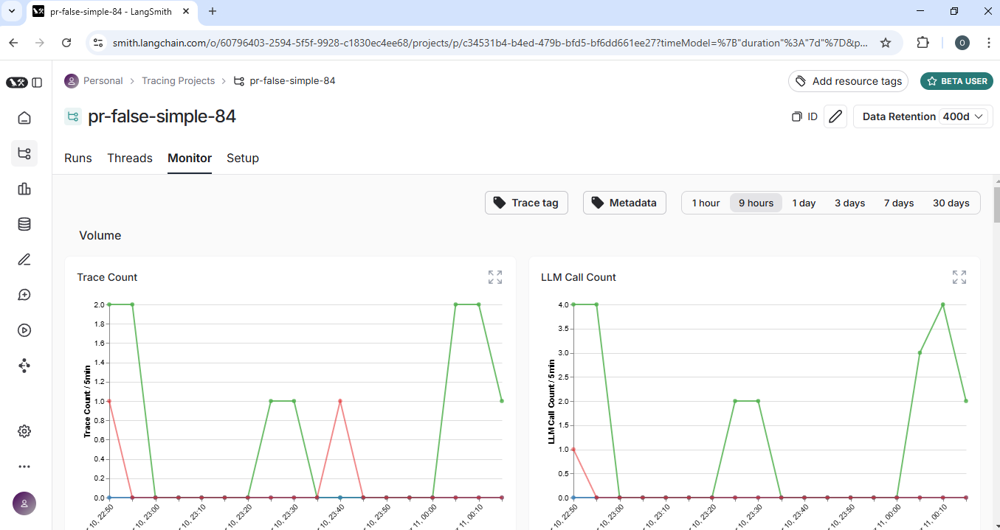

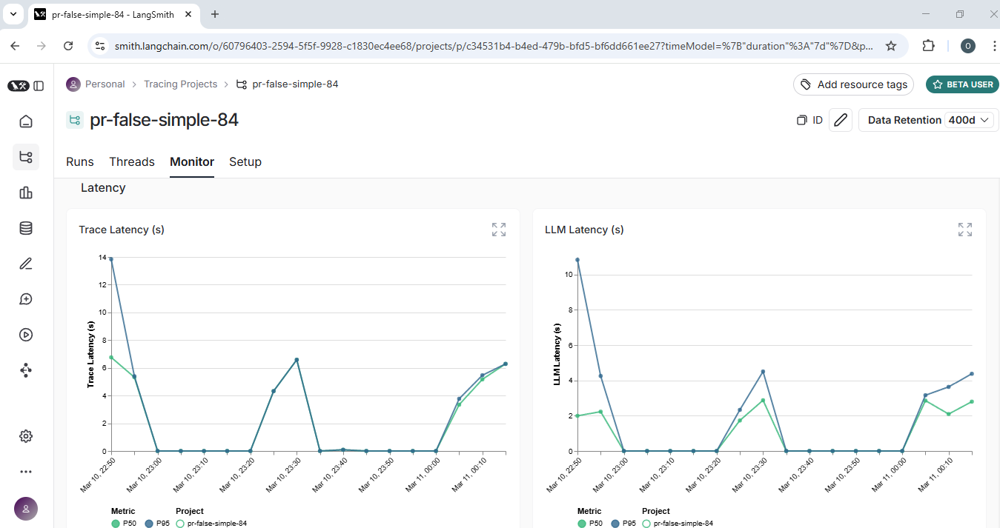

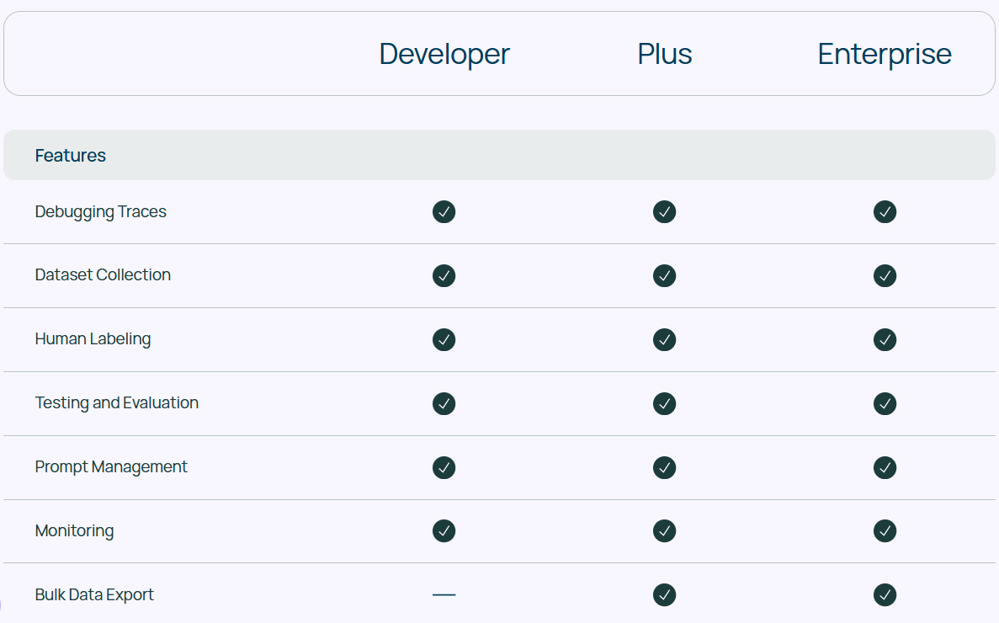